<a href="https://colab.research.google.com/github/OJB-Quantum/Notebooks-for-Ideas/blob/main/GPU_Accelerated_Band_Structure_of_hBN_with_Kwant_%2B_CuPy_in_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Authored by Onri Jay Benally (2026)

Open Access (CC-BY-4.0)

In [ ]:
"""This script initializes Conda in the Colab environment."""

!pip install -q condacolab
import condacolab
condacolab.install()

In [ ]:
"""This script installs the target scientific libraries via Conda and uv."""

# Control Knobs
CONDA_PACKAGES = [
    "kwant",
    "numpy",
    "scipy",
    "matplotlib"
]

PIP_PACKAGES = [
    "tinyarray>=1.2.4",
    "cupy-cuda12x"
]

!conda install -y -q -c conda-forge {" ".join(CONDA_PACKAGES)}
!python -m pip -q install uv
!uv pip install --system {" ".join(PIP_PACKAGES)}

GPU: NVIDIA L4
CuPy: 14.2.0
Kwant: 1.5.0
Precision: complex64

Calibrating GPU eigensolver throughput...
Benchmark checksum: -7.324723e+06
Measured throughput: 8,841,942 8x8 eigensystems/s
Benchmark time: 0.030 s

High-symmetry path: 7,201 k-points
Path GPU time: 0.002 s
Maximum Kwant/CuPy eigenvalue error: 2.687e-05 eV

Constructing GPU spectral heat maps...

Adaptive first-BZ grid:
  requested grid = 1801 x 1801
  in-BZ k-points = 2,358,533
  dense-BZ GPU time = 0.312 s

Minimum direct gap: 6.000020 eV
Indirect gap: 6.000020 eV

GPU k-mesh convergence study:
   101 x  101 |     7,301 BZ points | direct =   6.000904 eV | indirect =   6.000904 eV | GPU =   0.006 s
   151 x  151 |    16,281 BZ points | direct =   6.003499 eV | indirect =   6.003499 eV | GPU =   0.003 s
   201 x  201 |    29,205 BZ points | direct =   6.000904 eV | indirect =   6.000904 eV | GPU =   0.004 s
   301 x  301 |    65,417 BZ points | direct =   6.000689 eV | indirect =   6.000689 eV | GPU =   0.008 s
   401 x 

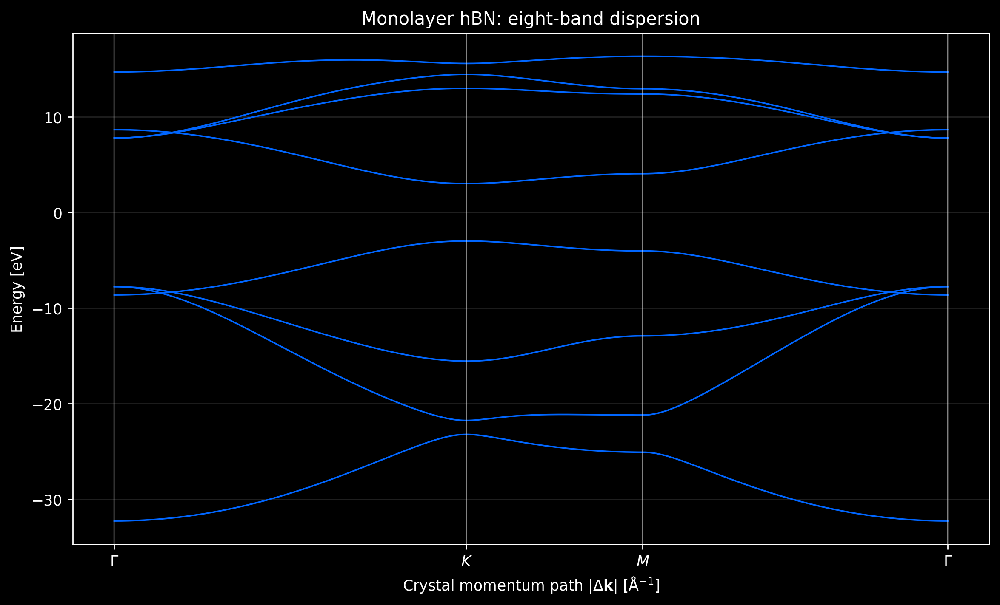

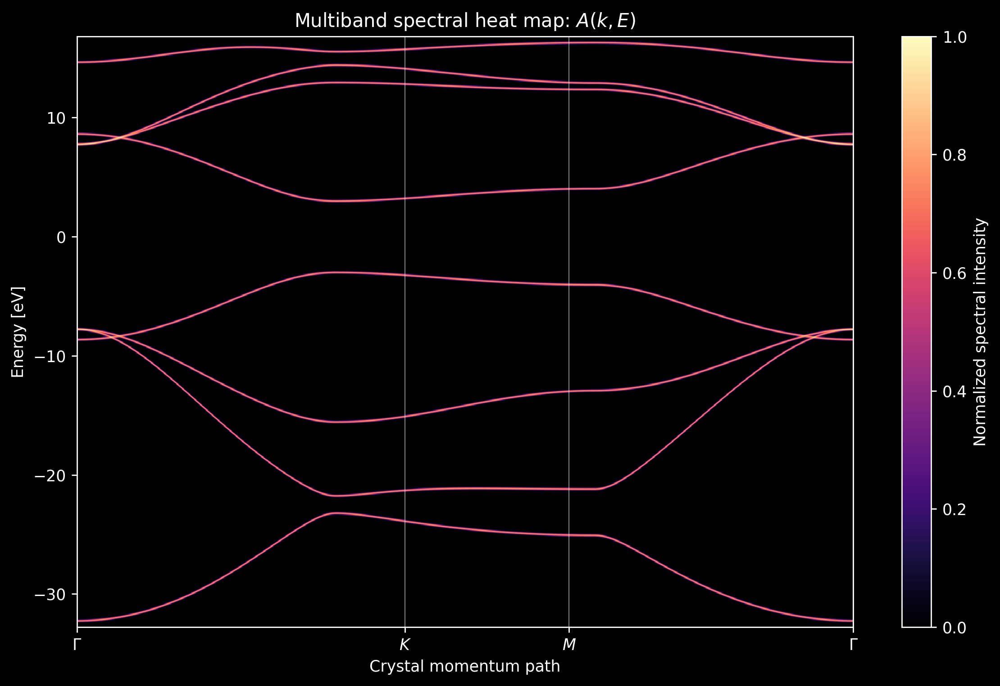

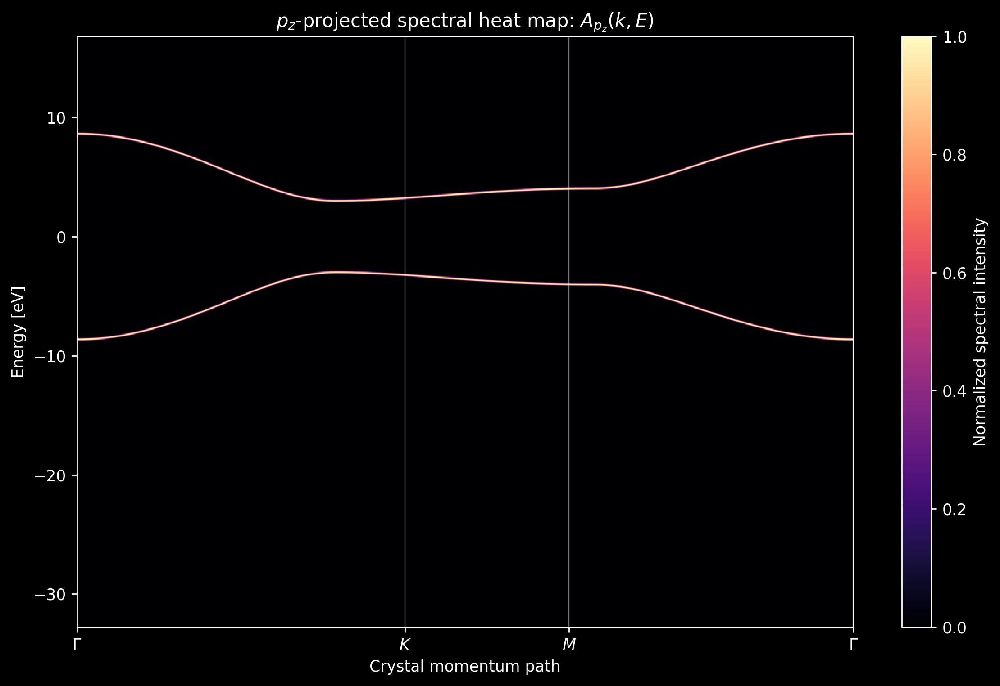

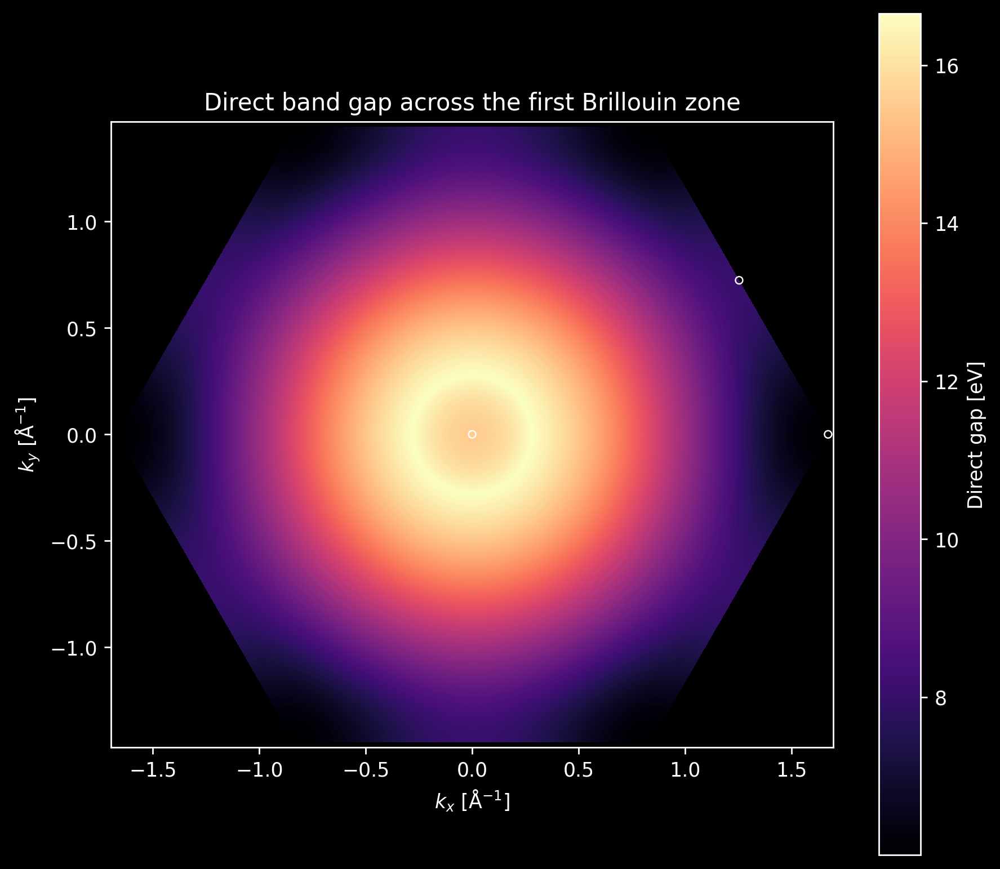

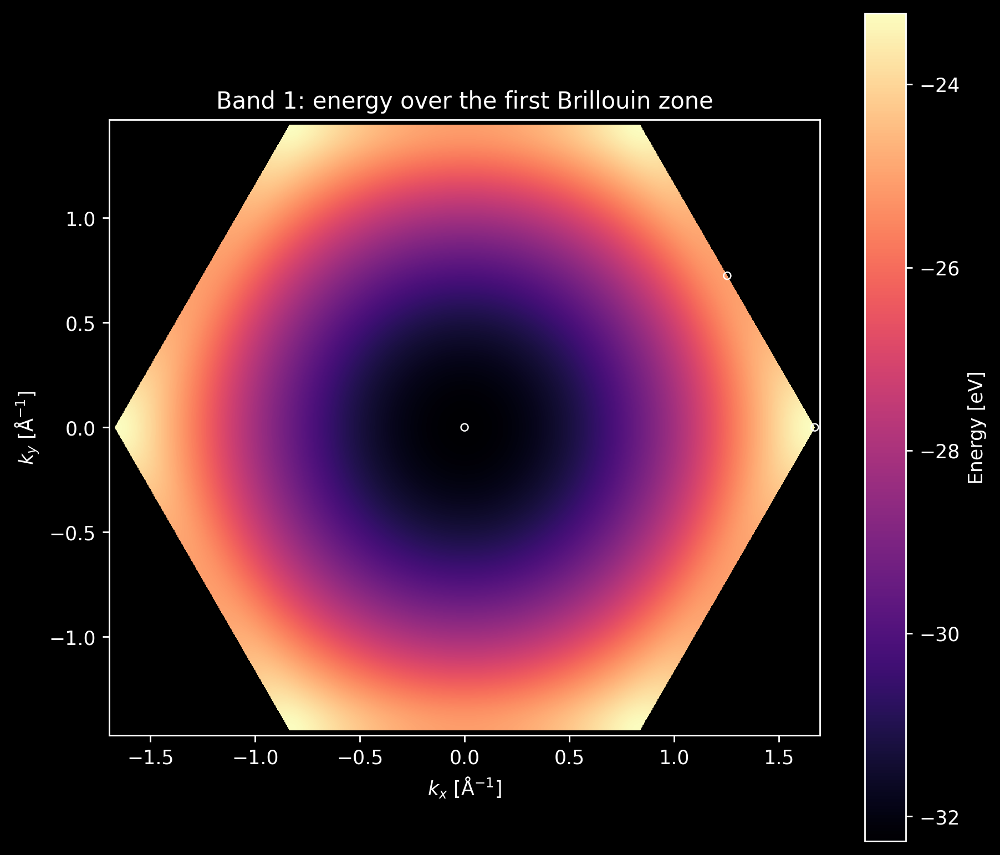

...

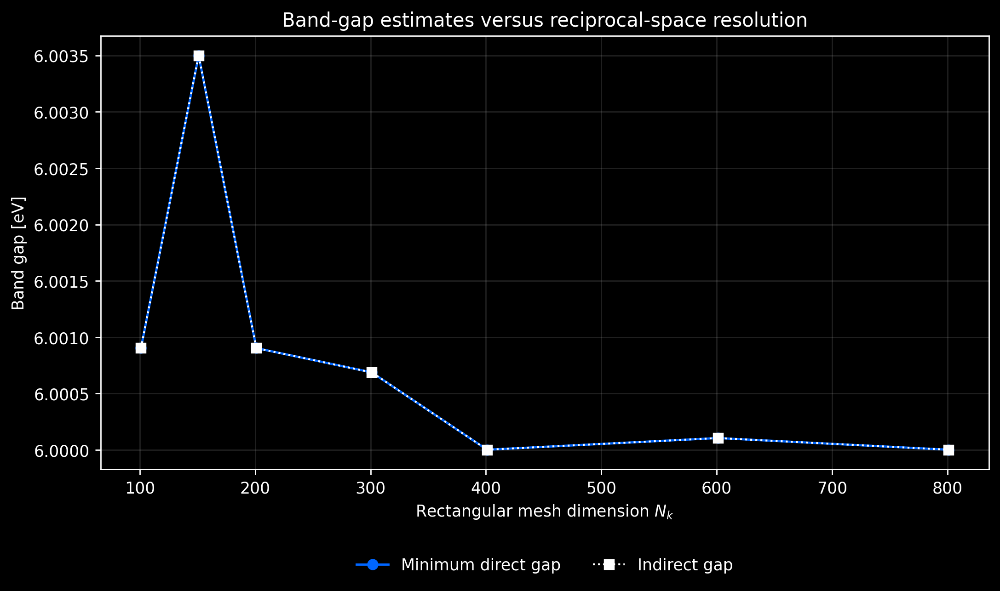

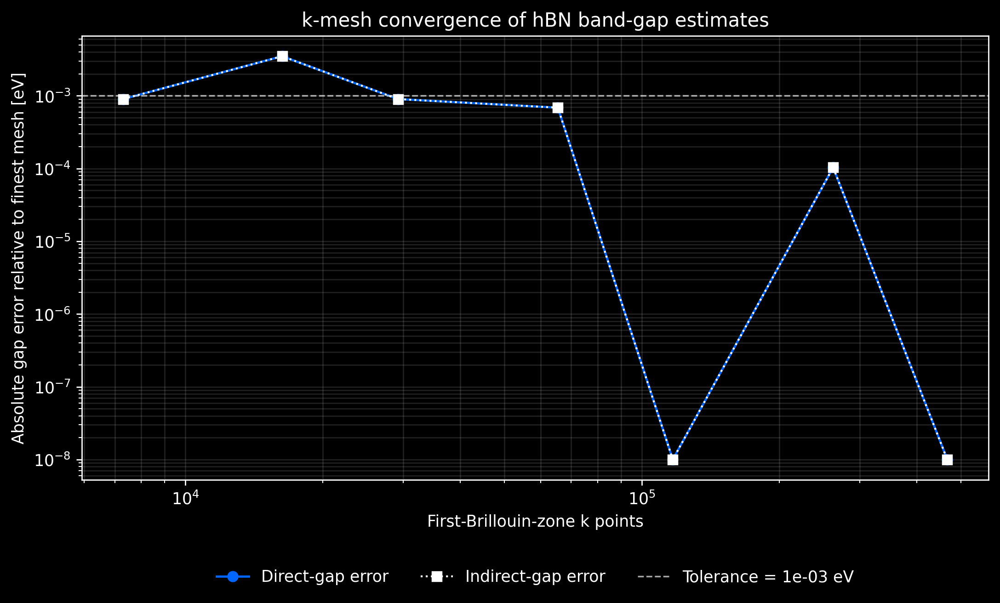

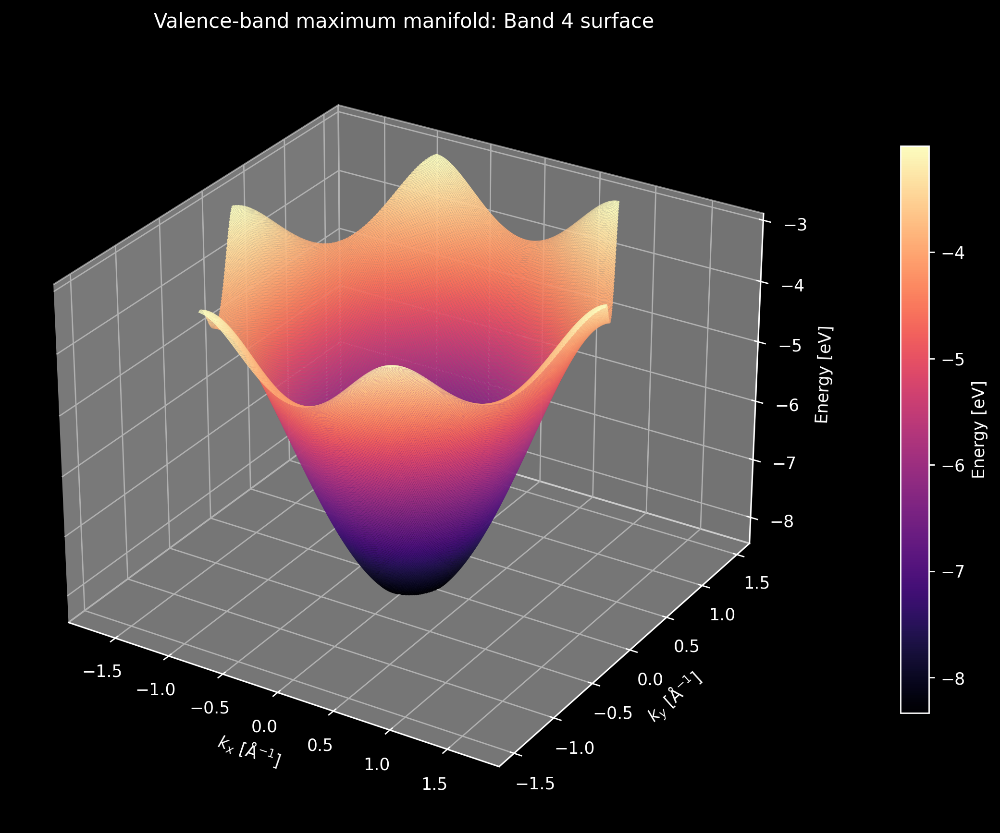

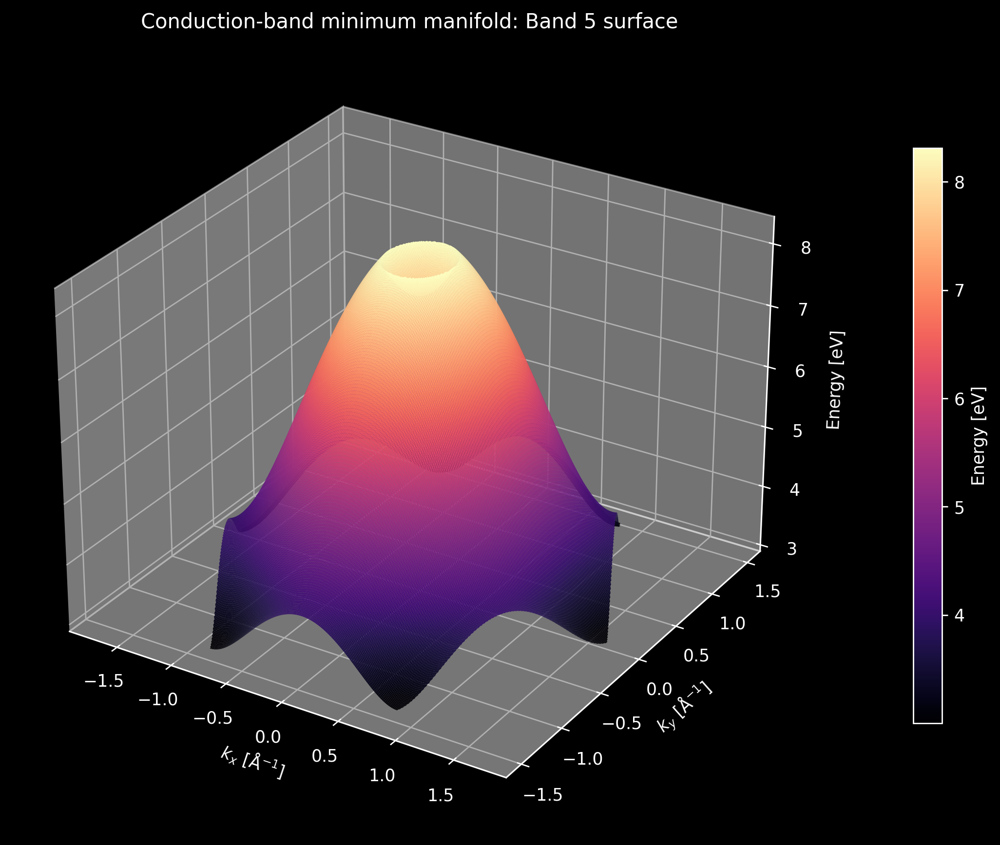

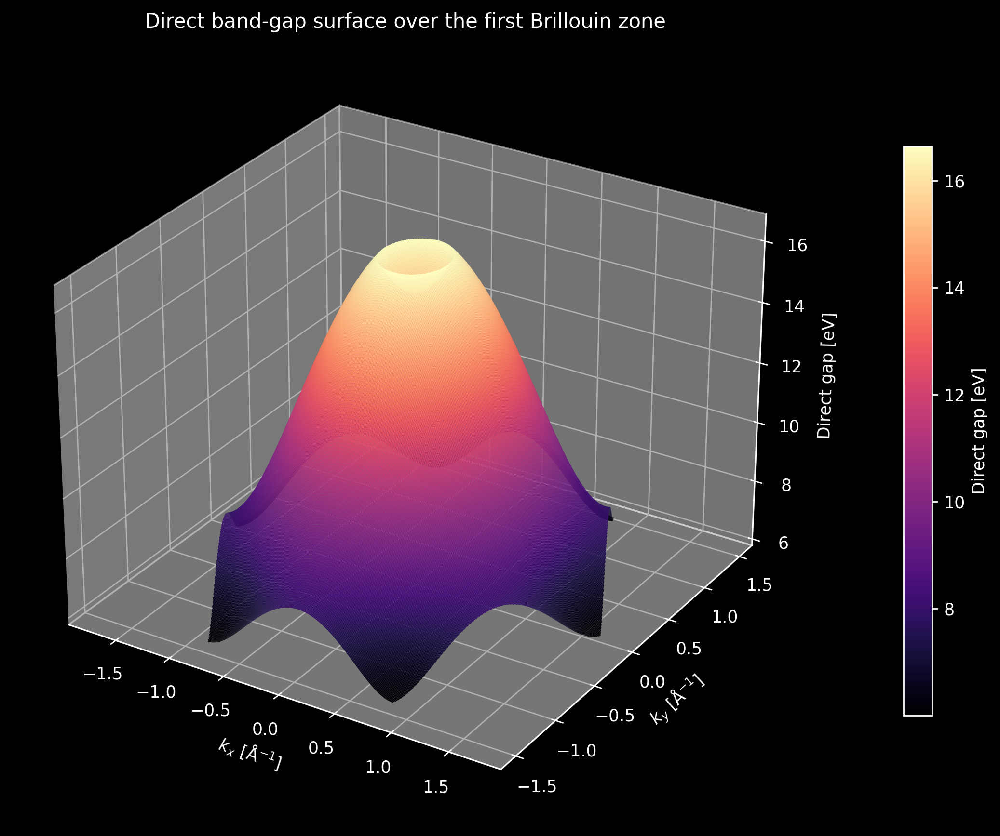


GPU memory report:
  CuPy pool used = 0.106 GiB
  free = 19.433 GiB
  total = 22.034 GiB


In [1]:
"""GPU-first multiband electronic-structure calculation for monolayer hBN.

Kwant defines an eight-band tight-binding model using s, px, py, and pz
orbitals on the boron and nitrogen sublattices. CuPy performs batched
Hermitian eigensolutions on a CUDA GPU.

The calculation produces:
    1. Gamma-K-M-Gamma multiband dispersion.
    2. A broadened multiband spectral heat map.
    3. A pz-projected spectral heat map.
    4. Eight first-Brillouin-zone band-energy heat maps.
    5. A direct-gap heat map.
    6. Three-dimensional valence, conduction, and direct-gap surfaces.
    7. A reciprocal-space density of states.
    8. A GPU k-mesh convergence study for direct and indirect gaps.
    9. A GPU-intensive biaxial-strain sweep.
    10. Direct and indirect band-gap evolution with strain.

The GPU workload is calibrated automatically from measured CuPy
eigensolver throughput and targeted toward a specified execution budget.
The convergence workload is charged against the same budget so that
verification increases numerical confidence without arbitrarily extending
the intended L4 calculation time.
"""

import math
import time

import cupy as cp
import kwant
import matplotlib.pyplot as plt
import numpy as np
from kwant.wraparound import wraparound


# -----------------------------------------------------------------------------
# Control knobs
# -----------------------------------------------------------------------------

TARGET_GPU_SECONDS = 170.0

GPU_BATCH_K_POINTS = 131_072
BENCHMARK_K_POINTS = 262_144
BENCHMARK_WARMUP_POINTS = 8_192

BZ_BUDGET_FRACTION = 0.28
BZ_FILL_ESTIMATE = 0.75

MIN_BZ_GRID_N = 601
MAX_BZ_GRID_N = 1801

MIN_STRAIN_GRID_N = 301
MAX_STRAIN_GRID_N = 1001

MIN_STRAIN_SAMPLES = 41
PREFERRED_STRAIN_SAMPLES = 121
MAX_STRAIN_SAMPLES = 401

STRAIN_MIN = -0.06
STRAIN_MAX = 0.06
HOPPING_DISTANCE_EXPONENT = 2.0

PATH_POINTS_PER_SEGMENT = 2400

SPECTRAL_ENERGY_BINS = 1200
SPECTRAL_SIGMA_EV = 0.045
SPECTRAL_K_CHUNK = 512
SPECTRAL_LOG_GAIN = 20.0

DOS_BINS = 600

RUN_CONVERGENCE_STUDY = True
CONVERGENCE_GRID_SIZES = (101, 151, 201, 301, 401, 601, 801)
CONVERGENCE_TOLERANCE_EV = 1.0e-3

PLOT_ALL_EIGHT_BAND_MAPS = True
PLOT_BZ_SURFACES = True
SURFACE_MAX_GRID_N = 301
SURFACE_ELEVATION_DEG = 28.0
SURFACE_AZIMUTH_DEG = -58.0
SURFACE_BAND_INDICES = (3, 4)

FIGURE_DPI = 250

USE_COMPLEX128 = False

RANDOM_SEED = 7


# -----------------------------------------------------------------------------
# Physical model controls
# -----------------------------------------------------------------------------

BN_BOND_LENGTH_ANGSTROM = 1.446

# The following parameter set provides a controllable eight-band
# Slater-Koster demonstration model.
#
# Orbital order:
#
#     [s, px, py, pz]
#
# A graphene-like nearest-neighbor hopping set is combined with B/N
# sublattice asymmetry. These values should eventually be replaced by
# a Wannier- or DFT-fitted hBN parameterization for quantitative work.

REFERENCE_S_ONSITE_EV = -8.8
SUBLATTICE_OFFSET_EV = 3.0

V_SS_SIGMA_EV = -7.76
V_SP_SIGMA_EV = 8.16
V_PP_SIGMA_EV = 7.48
V_PP_PI_EV = -2.70


# -----------------------------------------------------------------------------
# Plot controls
# -----------------------------------------------------------------------------

BAND_COLOR = "#0066ff"

plt.rcParams.update(
    {
        "figure.dpi": FIGURE_DPI,
        "savefig.dpi": FIGURE_DPI,
        "figure.facecolor": "black",
        "axes.facecolor": "black",
        "axes.edgecolor": "white",
        "axes.labelcolor": "white",
        "axes.titlecolor": "white",
        "xtick.color": "white",
        "ytick.color": "white",
        "text.color": "white",
        "grid.alpha": 0.18,
        "font.size": 10,
    }
)


# -----------------------------------------------------------------------------
# Numerical data types
# -----------------------------------------------------------------------------

CP_COMPLEX = (
    cp.complex128
    if USE_COMPLEX128
    else cp.complex64
)

CP_REAL = (
    cp.float64
    if USE_COMPLEX128
    else cp.float32
)

NP_REAL = (
    np.float64
    if USE_COMPLEX128
    else np.float32
)


# -----------------------------------------------------------------------------
# Lattice geometry
# -----------------------------------------------------------------------------

bond = BN_BOND_LENGTH_ANGSTROM

a1 = np.array(
    [
        math.sqrt(3.0) * bond,
        0.0,
    ],
    dtype=float,
)

a2 = np.array(
    [
        math.sqrt(3.0) * bond / 2.0,
        1.5 * bond,
    ],
    dtype=float,
)

PRIMITIVE = np.vstack([a1, a2])

RECIPROCAL = (
    2.0
    * np.pi
    * np.linalg.inv(PRIMITIVE).T
)

b1 = RECIPROCAL[0]
b2 = RECIPROCAL[1]

DELTAS = np.array(
    [
        [
            0.0,
            bond,
        ],
        [
            math.sqrt(3.0) * bond / 2.0,
            -bond / 2.0,
        ],
        [
            -math.sqrt(3.0) * bond / 2.0,
            -bond / 2.0,
        ],
    ],
    dtype=float,
)

GAMMA = np.array(
    [0.0, 0.0],
    dtype=float,
)

K_POINT = (
    2.0 * b1 + b2
) / 3.0

M_POINT = (
    b1 + b2
) / 2.0


# -----------------------------------------------------------------------------
# Onsite matrices
# -----------------------------------------------------------------------------

ONSITE_B = np.diag(
    [
        REFERENCE_S_ONSITE_EV + SUBLATTICE_OFFSET_EV,
        SUBLATTICE_OFFSET_EV,
        SUBLATTICE_OFFSET_EV,
        SUBLATTICE_OFFSET_EV,
    ]
).astype(float)

ONSITE_N = np.diag(
    [
        REFERENCE_S_ONSITE_EV - SUBLATTICE_OFFSET_EV,
        -SUBLATTICE_OFFSET_EV,
        -SUBLATTICE_OFFSET_EV,
        -SUBLATTICE_OFFSET_EV,
    ]
).astype(float)


# -----------------------------------------------------------------------------
# Slater-Koster construction
# -----------------------------------------------------------------------------

def slater_koster_hopping(
    displacement: np.ndarray,
) -> np.ndarray:
    """Return a 4 x 4 nearest-neighbor Slater-Koster matrix.

    Args:
        displacement: Real-space B-to-N displacement vector in angstrom.

    Returns:
        Hopping matrix in the [s, px, py, pz] orbital basis.
    """
    vector = np.asarray(
        displacement,
        dtype=float,
    )

    distance = np.linalg.norm(vector)

    l = vector[0] / distance
    m = vector[1] / distance

    hopping = np.zeros(
        (4, 4),
        dtype=float,
    )

    hopping[0, 0] = V_SS_SIGMA_EV

    hopping[0, 1] = l * V_SP_SIGMA_EV
    hopping[0, 2] = m * V_SP_SIGMA_EV

    hopping[1, 0] = -l * V_SP_SIGMA_EV
    hopping[2, 0] = -m * V_SP_SIGMA_EV

    hopping[1, 1] = (
        l**2 * V_PP_SIGMA_EV
        + (1.0 - l**2) * V_PP_PI_EV
    )

    hopping[2, 2] = (
        m**2 * V_PP_SIGMA_EV
        + (1.0 - m**2) * V_PP_PI_EV
    )

    hopping[1, 2] = (
        l
        * m
        * (
            V_PP_SIGMA_EV
            - V_PP_PI_EV
        )
    )

    hopping[2, 1] = hopping[1, 2]

    hopping[3, 3] = V_PP_PI_EV

    return hopping


HOPPING_MATRICES = np.stack(
    [
        slater_koster_hopping(delta)
        for delta in DELTAS
    ]
)


# -----------------------------------------------------------------------------
# GPU constants
# -----------------------------------------------------------------------------

ONSITE_B_GPU = cp.asarray(
    ONSITE_B,
    dtype=CP_COMPLEX,
)

ONSITE_N_GPU = cp.asarray(
    ONSITE_N,
    dtype=CP_COMPLEX,
)

DELTAS_GPU = cp.asarray(
    DELTAS,
    dtype=CP_REAL,
)

HOPPING_GPU = cp.asarray(
    HOPPING_MATRICES,
    dtype=CP_COMPLEX,
)


# -----------------------------------------------------------------------------
# GPU Hamiltonian
# -----------------------------------------------------------------------------

def assemble_hamiltonians_gpu(
    k_points_gpu: cp.ndarray,
    scaled_hopping_gpu: cp.ndarray,
) -> cp.ndarray:
    """Construct a batch of eight-band Bloch Hamiltonians on the GPU.

    Args:
        k_points_gpu: Cartesian reciprocal vectors with shape (N, 2).
        scaled_hopping_gpu: Three 4 x 4 hopping matrices.

    Returns:
        Hermitian Hamiltonians with shape (N, 8, 8).
    """
    phase_arguments = (
        k_points_gpu
        @ DELTAS_GPU.T
    )

    phases = cp.exp(
        1j * phase_arguments
    )

    coupling = cp.einsum(
        "nk,kij->nij",
        phases,
        scaled_hopping_gpu,
        optimize=True,
    )

    count = k_points_gpu.shape[0]

    hamiltonians = cp.zeros(
        (
            count,
            8,
            8,
        ),
        dtype=CP_COMPLEX,
    )

    hamiltonians[:, :4, :4] = ONSITE_B_GPU
    hamiltonians[:, 4:, 4:] = ONSITE_N_GPU

    hamiltonians[:, :4, 4:] = coupling

    hamiltonians[:, 4:, :4] = cp.swapaxes(
        coupling.conj(),
        1,
        2,
    )

    return hamiltonians


def gpu_eigenvalues_resident(
    k_points_gpu: cp.ndarray,
    hopping_scale: float = 1.0,
) -> cp.ndarray:
    """Calculate all eigenvalues and retain them in GPU memory."""
    point_count = k_points_gpu.shape[0]

    output = cp.empty(
        (
            point_count,
            8,
        ),
        dtype=CP_REAL,
    )

    scaled_hopping = (
        HOPPING_GPU
        * CP_REAL(hopping_scale)
    )

    for start in range(
        0,
        point_count,
        GPU_BATCH_K_POINTS,
    ):
        stop = min(
            start + GPU_BATCH_K_POINTS,
            point_count,
        )

        hamiltonians = (
            assemble_hamiltonians_gpu(
                k_points_gpu[start:stop],
                scaled_hopping,
            )
        )

        output[start:stop] = (
            cp.linalg.eigvalsh(
                hamiltonians
            )
        )

        del hamiltonians

    return output


def gpu_eigensystem_resident(
    k_points_gpu: cp.ndarray,
) -> tuple[cp.ndarray, cp.ndarray]:
    """Calculate path eigenvalues and eigenvectors on the GPU."""
    point_count = k_points_gpu.shape[0]

    eigenvalues = cp.empty(
        (
            point_count,
            8,
        ),
        dtype=CP_REAL,
    )

    eigenvectors = cp.empty(
        (
            point_count,
            8,
            8,
        ),
        dtype=CP_COMPLEX,
    )

    for start in range(
        0,
        point_count,
        GPU_BATCH_K_POINTS,
    ):
        stop = min(
            start + GPU_BATCH_K_POINTS,
            point_count,
        )

        hamiltonians = (
            assemble_hamiltonians_gpu(
                k_points_gpu[start:stop],
                HOPPING_GPU,
            )
        )

        values, vectors = cp.linalg.eigh(
            hamiltonians
        )

        eigenvalues[start:stop] = values
        eigenvectors[start:stop] = vectors

        del hamiltonians
        del values
        del vectors

    return eigenvalues, eigenvectors


# -----------------------------------------------------------------------------
# GPU workload calibration
# -----------------------------------------------------------------------------

def benchmark_gpu_solver() -> tuple[float, float]:
    """Measure batched eigensolver throughput on the current GPU."""
    rng = np.random.default_rng(
        RANDOM_SEED
    )

    reciprocal_scale = max(
        np.linalg.norm(b1),
        np.linalg.norm(b2),
    )

    k_test = rng.uniform(
        -reciprocal_scale,
        reciprocal_scale,
        size=(
            BENCHMARK_K_POINTS,
            2,
        ),
    ).astype(NP_REAL)

    k_gpu = cp.asarray(
        k_test,
        dtype=CP_REAL,
    )

    warmup = gpu_eigenvalues_resident(
        k_gpu[:BENCHMARK_WARMUP_POINTS]
    )

    _ = float(
        cp.sum(warmup).get()
    )

    del warmup

    cp.cuda.Device().synchronize()

    start = time.perf_counter()

    eigenvalues = gpu_eigenvalues_resident(
        k_gpu
    )

    checksum = float(
        cp.sum(
            eigenvalues[:, 0]
        ).get()
    )

    cp.cuda.Device().synchronize()

    elapsed = (
        time.perf_counter()
        - start
    )

    del eigenvalues
    del k_gpu

    throughput = (
        BENCHMARK_K_POINTS
        / elapsed
    )

    print(
        f"Benchmark checksum: {checksum:.6e}"
    )

    return throughput, elapsed


# -----------------------------------------------------------------------------
# Reciprocal-space mesh
# -----------------------------------------------------------------------------

def first_bz_mesh(
    grid_n: int,
) -> tuple[
    np.ndarray,
    np.ndarray,
    np.ndarray,
    np.ndarray,
    np.ndarray,
]:
    """Generate a Cartesian mesh masked to the first Brillouin zone."""
    vertices = np.array(
        [
            (2.0 * b1 + b2) / 3.0,
            (b1 + 2.0 * b2) / 3.0,
            (-b1 + b2) / 3.0,
            -(2.0 * b1 + b2) / 3.0,
            -(b1 + 2.0 * b2) / 3.0,
            (b1 - b2) / 3.0,
        ],
        dtype=float,
    )

    kx_max = (
        1.015
        * np.max(
            np.abs(
                vertices[:, 0]
            )
        )
    )

    ky_max = (
        1.015
        * np.max(
            np.abs(
                vertices[:, 1]
            )
        )
    )

    kx_axis = np.linspace(
        -kx_max,
        kx_max,
        grid_n,
        dtype=NP_REAL,
    )

    ky_axis = np.linspace(
        -ky_max,
        ky_max,
        grid_n,
        dtype=NP_REAL,
    )

    kx_grid, ky_grid = np.meshgrid(
        kx_axis,
        ky_axis,
        indexing="xy",
    )

    points = np.column_stack(
        [
            kx_grid.ravel(),
            ky_grid.ravel(),
        ]
    ).astype(NP_REAL)

    nearest_reciprocal_vectors = np.array(
        [
            b1,
            b2,
            b1 + b2,
        ],
        dtype=float,
    )

    mask = np.ones(
        points.shape[0],
        dtype=bool,
    )

    tolerance = 5e-7

    for reciprocal_vector in (
        nearest_reciprocal_vectors
    ):
        limit = (
            np.dot(
                reciprocal_vector,
                reciprocal_vector,
            )
            / 2.0
        )

        projection = (
            points
            @ reciprocal_vector
        )

        mask &= (
            np.abs(projection)
            <= limit + tolerance
        )

    flat_indices = np.flatnonzero(mask)

    bz_points = points[mask]

    return (
        kx_axis,
        ky_axis,
        mask.reshape(
            grid_n,
            grid_n,
        ),
        flat_indices,
        bz_points,
    )


def clamp_odd(
    value: float,
    minimum: int,
    maximum: int,
) -> int:
    """Clamp a numerical grid size and force an odd integer."""
    integer = int(
        round(value)
    )

    integer = max(
        minimum,
        min(
            maximum,
            integer,
        ),
    )

    if integer % 2 == 0:
        integer += 1

    if integer > maximum:
        integer -= 2

    return integer


# -----------------------------------------------------------------------------
# High-symmetry path
# -----------------------------------------------------------------------------

def interpolate_segment(
    start: np.ndarray,
    stop: np.ndarray,
    count: int,
    endpoint: bool,
) -> np.ndarray:
    """Interpolate one Cartesian reciprocal-space segment."""
    return np.linspace(
        start,
        stop,
        count,
        endpoint=endpoint,
        dtype=NP_REAL,
    )


def build_high_symmetry_path(
) -> tuple[
    np.ndarray,
    np.ndarray,
    np.ndarray,
]:
    """Construct Gamma-K-M-Gamma and its cumulative distance."""
    segment_1 = interpolate_segment(
        GAMMA,
        K_POINT,
        PATH_POINTS_PER_SEGMENT,
        False,
    )

    segment_2 = interpolate_segment(
        K_POINT,
        M_POINT,
        PATH_POINTS_PER_SEGMENT,
        False,
    )

    segment_3 = interpolate_segment(
        M_POINT,
        GAMMA,
        PATH_POINTS_PER_SEGMENT + 1,
        True,
    )

    path = np.vstack(
        [
            segment_1,
            segment_2,
            segment_3,
        ]
    )

    increments = np.linalg.norm(
        np.diff(
            path,
            axis=0,
        ),
        axis=1,
    )

    distance = np.concatenate(
        [
            np.array(
                [0.0]
            ),
            np.cumsum(
                increments
            ),
        ]
    )

    node_indices = np.array(
        [
            0,
            PATH_POINTS_PER_SEGMENT,
            2 * PATH_POINTS_PER_SEGMENT,
            path.shape[0] - 1,
        ],
        dtype=int,
    )

    return (
        path,
        distance,
        node_indices,
    )


# -----------------------------------------------------------------------------
# Kwant reference model
# -----------------------------------------------------------------------------

def build_kwant_model():
    """Construct and wrap the eight-band Kwant hBN model."""
    lattice = kwant.lattice.general(
        PRIMITIVE,
        [
            np.array(
                [0.0, 0.0]
            ),
            DELTAS[0],
        ],
        norbs=4,
        name="hBN",
    )

    boron, nitrogen = lattice.sublattices

    symmetry = kwant.TranslationalSymmetry(
        *PRIMITIVE
    )

    builder = kwant.Builder(
        symmetry
    )

    builder[boron(0, 0)] = ONSITE_B
    builder[nitrogen(0, 0)] = ONSITE_N

    builder[
        boron(0, 0),
        nitrogen(0, 0),
    ] = HOPPING_MATRICES[0]

    builder[
        boron(0, 0),
        nitrogen(1, -1),
    ] = HOPPING_MATRICES[1]

    builder[
        boron(0, 0),
        nitrogen(0, -1),
    ] = HOPPING_MATRICES[2]

    wrapped = wraparound(
        builder,
        coordinate_names=(
            "x",
            "y",
        ),
    ).finalized()

    return wrapped


def verify_against_kwant(
    wrapped_system,
    path: np.ndarray,
    gpu_values: np.ndarray,
) -> float:
    """Compare selected CuPy eigenvalues with Kwant Hamiltonians."""
    indices = np.unique(
        np.linspace(
            0,
            path.shape[0] - 1,
            24,
            dtype=int,
        )
    )

    largest_error = 0.0

    for index in indices:
        k_vector = path[index]

        phase_x = float(
            np.dot(
                k_vector,
                PRIMITIVE[0],
            )
        )

        phase_y = float(
            np.dot(
                k_vector,
                PRIMITIVE[1],
            )
        )

        hamiltonian = (
            wrapped_system.hamiltonian_submatrix(
                params={
                    "k_x": phase_x,
                    "k_y": phase_y,
                },
                sparse=False,
            )
        )

        reference = np.linalg.eigvalsh(
            hamiltonian
        )

        error = np.max(
            np.abs(
                reference
                - gpu_values[index]
            )
        )

        largest_error = max(
            largest_error,
            float(error),
        )

    return largest_error


# -----------------------------------------------------------------------------
# GPU spectral heat-map construction
# -----------------------------------------------------------------------------

def gpu_spectral_heatmap(
    eigenvalues_gpu: cp.ndarray,
    weights_gpu: cp.ndarray | None = None,
    energy_axis: np.ndarray | None = None,
) -> tuple[np.ndarray, np.ndarray]:
    """Generate a Gaussian-broadened spectral map entirely on the GPU."""
    if energy_axis is None:
        energy_min = float(
            cp.min(
                eigenvalues_gpu
            ).get()
        ) - 0.5

        energy_max = float(
            cp.max(
                eigenvalues_gpu
            ).get()
        ) + 0.5

        energy_axis = np.linspace(
            energy_min,
            energy_max,
            SPECTRAL_ENERGY_BINS,
            dtype=NP_REAL,
        )

    energy_gpu = cp.asarray(
        energy_axis,
        dtype=CP_REAL,
    )

    k_count = eigenvalues_gpu.shape[0]

    spectrum_gpu = cp.empty(
        (
            energy_axis.size,
            k_count,
        ),
        dtype=CP_REAL,
    )

    sigma = CP_REAL(
        SPECTRAL_SIGMA_EV
    )

    for start in range(
        0,
        k_count,
        SPECTRAL_K_CHUNK,
    ):
        stop = min(
            start + SPECTRAL_K_CHUNK,
            k_count,
        )

        energies = eigenvalues_gpu[
            start:stop
        ]

        differences = (
            energy_gpu[:, None, None]
            - energies[None, :, :]
        ) / sigma

        kernel = cp.exp(
            -0.5
            * differences
            * differences
        )

        if weights_gpu is not None:
            kernel *= (
                weights_gpu[
                    start:stop
                ][None, :, :]
            )

        spectrum_gpu[
            :,
            start:stop,
        ] = cp.sum(
            kernel,
            axis=2,
        )

        del differences
        del kernel

    spectrum_gpu = cp.log1p(
        CP_REAL(SPECTRAL_LOG_GAIN)
        * spectrum_gpu
    )

    maximum = cp.max(
        spectrum_gpu
    )

    if float(maximum.get()) > 0.0:
        spectrum_gpu /= maximum

    spectrum = cp.asnumpy(
        spectrum_gpu
    )

    del spectrum_gpu

    return (
        np.asarray(
            energy_axis
        ),
        spectrum,
    )


# -----------------------------------------------------------------------------
# Dense-strain BZ reduction
# -----------------------------------------------------------------------------

def gpu_band_extrema(
    k_points_gpu: cp.ndarray,
    hopping_scale: float,
) -> tuple[
    np.ndarray,
    np.ndarray,
    float,
    float,
]:
    """Calculate band extrema and gaps without storing the full spectrum."""
    minima = cp.full(
        8,
        cp.inf,
        dtype=CP_REAL,
    )

    maxima = cp.full(
        8,
        -cp.inf,
        dtype=CP_REAL,
    )

    minimum_direct_gap = cp.asarray(
        cp.inf,
        dtype=CP_REAL,
    )

    scaled_hopping = (
        HOPPING_GPU
        * CP_REAL(hopping_scale)
    )

    point_count = (
        k_points_gpu.shape[0]
    )

    for start in range(
        0,
        point_count,
        GPU_BATCH_K_POINTS,
    ):
        stop = min(
            start + GPU_BATCH_K_POINTS,
            point_count,
        )

        hamiltonians = (
            assemble_hamiltonians_gpu(
                k_points_gpu[start:stop],
                scaled_hopping,
            )
        )

        energies = cp.linalg.eigvalsh(
            hamiltonians
        )

        minima = cp.minimum(
            minima,
            cp.min(
                energies,
                axis=0,
            ),
        )

        maxima = cp.maximum(
            maxima,
            cp.max(
                energies,
                axis=0,
            ),
        )

        local_direct_gap = cp.min(
            energies[:, 4]
            - energies[:, 3]
        )

        minimum_direct_gap = cp.minimum(
            minimum_direct_gap,
            local_direct_gap,
        )

        del hamiltonians
        del energies

    indirect_gap = (
        minima[4]
        - maxima[3]
    )

    return (
        cp.asnumpy(
            minima
        ),
        cp.asnumpy(
            maxima
        ),
        float(
            minimum_direct_gap.get()
        ),
        float(
            indirect_gap.get()
        ),
    )


# -----------------------------------------------------------------------------
# GPU k-mesh convergence study
# -----------------------------------------------------------------------------

def run_gap_convergence_study(
    grid_sizes: tuple[int, ...],
) -> dict[str, np.ndarray | float]:
    """Measure direct- and indirect-gap convergence with BZ mesh density.

    Args:
        grid_sizes: Odd rectangular mesh dimensions used to sample the first
            Brillouin zone.

    Returns:
        Dictionary containing grid sizes, in-BZ point counts, gap estimates,
        absolute errors relative to the finest mesh, and measured GPU times.
    """
    cleaned_sizes = sorted(
        {
            int(size)
            for size in grid_sizes
            if int(size) >= 11
        }
    )

    if len(cleaned_sizes) < 2:
        raise ValueError(
            "CONVERGENCE_GRID_SIZES requires at least two mesh sizes."
        )

    direct_gaps = []
    indirect_gaps = []
    point_counts = []
    elapsed_times = []

    print()
    print("GPU k-mesh convergence study:")

    for grid_n in cleaned_sizes:
        if grid_n % 2 == 0:
            grid_n += 1

        (
            _,
            _,
            _,
            _,
            k_points,
        ) = first_bz_mesh(grid_n)

        k_points_gpu = cp.asarray(
            k_points,
            dtype=CP_REAL,
        )

        cp.cuda.Device().synchronize()
        start = time.perf_counter()

        (
            _,
            _,
            direct_gap,
            indirect_gap,
        ) = gpu_band_extrema(
            k_points_gpu,
            hopping_scale=1.0,
        )

        cp.cuda.Device().synchronize()
        elapsed = time.perf_counter() - start

        direct_gaps.append(direct_gap)
        indirect_gaps.append(indirect_gap)
        point_counts.append(k_points.shape[0])
        elapsed_times.append(elapsed)

        print(
            f"  {grid_n:4d} x {grid_n:4d} | "
            f"{k_points.shape[0]:9,d} BZ points | "
            f"direct = {direct_gap:10.6f} eV | "
            f"indirect = {indirect_gap:10.6f} eV | "
            f"GPU = {elapsed:7.3f} s"
        )

        del k_points_gpu

    grid_array = np.asarray(cleaned_sizes, dtype=int)
    points_array = np.asarray(point_counts, dtype=int)
    direct_array = np.asarray(direct_gaps, dtype=float)
    indirect_array = np.asarray(indirect_gaps, dtype=float)
    time_array = np.asarray(elapsed_times, dtype=float)

    direct_reference = direct_array[-1]
    indirect_reference = indirect_array[-1]

    direct_error = np.abs(
        direct_array - direct_reference
    )
    indirect_error = np.abs(
        indirect_array - indirect_reference
    )

    finest_pair_error = max(
        abs(direct_array[-1] - direct_array[-2]),
        abs(indirect_array[-1] - indirect_array[-2]),
    )

    print()
    print(
        "  Finest-mesh direct gap: "
        f"{direct_reference:.8f} eV"
    )
    print(
        "  Finest-mesh indirect gap: "
        f"{indirect_reference:.8f} eV"
    )
    print(
        "  Finest-pair maximum gap change: "
        f"{finest_pair_error:.3e} eV"
    )
    print(
        "  Requested convergence tolerance: "
        f"{CONVERGENCE_TOLERANCE_EV:.3e} eV"
    )
    print(
        "  Convergence criterion: "
        + (
            "PASS"
            if finest_pair_error <= CONVERGENCE_TOLERANCE_EV
            else "REFINE MESH"
        )
    )

    return {
        "grid_sizes": grid_array,
        "point_counts": points_array,
        "direct_gaps": direct_array,
        "indirect_gaps": indirect_array,
        "direct_error": direct_error,
        "indirect_error": indirect_error,
        "gpu_times": time_array,
        "total_gpu_seconds": float(np.sum(time_array)),
        "finest_pair_error": float(finest_pair_error),
    }


def plot_gap_convergence(
    convergence: dict[str, np.ndarray | float],
) -> None:
    """Plot BZ gap error against the number of sampled k points."""
    point_counts = np.asarray(
        convergence["point_counts"],
        dtype=float,
    )
    direct_error = np.asarray(
        convergence["direct_error"],
        dtype=float,
    )
    indirect_error = np.asarray(
        convergence["indirect_error"],
        dtype=float,
    )

    floor = max(
        np.finfo(float).eps,
        CONVERGENCE_TOLERANCE_EV * 1.0e-5,
    )

    direct_plot = np.maximum(
        direct_error,
        floor,
    )
    indirect_plot = np.maximum(
        indirect_error,
        floor,
    )

    fig, ax = plt.subplots(
        figsize=(8.8, 5.4)
    )

    ax.loglog(
        point_counts,
        direct_plot,
        marker="o",
        linewidth=1.4,
        color=BAND_COLOR,
        label="Direct-gap error",
    )

    ax.loglog(
        point_counts,
        indirect_plot,
        marker="s",
        linewidth=1.2,
        linestyle=":",
        color="white",
        label="Indirect-gap error",
    )

    ax.axhline(
        CONVERGENCE_TOLERANCE_EV,
        linewidth=1.0,
        linestyle="--",
        color="white",
        alpha=0.65,
        label=(
            "Tolerance = "
            f"{CONVERGENCE_TOLERANCE_EV:.0e} eV"
        ),
    )

    ax.set_xlabel(
        "First-Brillouin-zone k points"
    )
    ax.set_ylabel(
        "Absolute gap error relative to finest mesh [eV]"
    )
    ax.set_title(
        "k-mesh convergence of hBN band-gap estimates"
    )
    ax.grid(True, which="both")

    ax.legend(
        loc="upper center",
        bbox_to_anchor=(0.5, -0.17),
        ncol=3,
        frameon=False,
    )

    fig.tight_layout()
    plt.show()
    plt.close(fig)


def plot_gap_estimates_vs_mesh(
    convergence: dict[str, np.ndarray | float],
) -> None:
    """Plot direct and indirect gap estimates across convergence meshes."""
    grid_sizes = np.asarray(
        convergence["grid_sizes"],
        dtype=int,
    )
    direct_gaps = np.asarray(
        convergence["direct_gaps"],
        dtype=float,
    )
    indirect_gaps = np.asarray(
        convergence["indirect_gaps"],
        dtype=float,
    )

    fig, ax = plt.subplots(
        figsize=(8.8, 5.3)
    )

    ax.plot(
        grid_sizes,
        direct_gaps,
        marker="o",
        linewidth=1.4,
        color=BAND_COLOR,
        label="Minimum direct gap",
    )

    ax.plot(
        grid_sizes,
        indirect_gaps,
        marker="s",
        linewidth=1.2,
        linestyle=":",
        color="white",
        label="Indirect gap",
    )

    ax.set_xlabel(
        r"Rectangular mesh dimension $N_k$"
    )
    ax.set_ylabel(
        "Band gap [eV]"
    )
    ax.set_title(
        "Band-gap estimates versus reciprocal-space resolution"
    )
    ax.grid(True)

    ax.legend(
        loc="upper center",
        bbox_to_anchor=(0.5, -0.17),
        ncol=2,
        frameon=False,
    )

    fig.tight_layout()
    plt.show()
    plt.close(fig)


# -----------------------------------------------------------------------------
# Three-dimensional Brillouin-zone surfaces
# -----------------------------------------------------------------------------

def plot_bz_surface(
    kx_axis: np.ndarray,
    ky_axis: np.ndarray,
    image_data: np.ndarray,
    title: str,
    z_label: str,
) -> None:
    """Plot a downsampled 3D first-Brillouin-zone scalar surface.

    Args:
        kx_axis: Cartesian reciprocal-space x coordinates.
        ky_axis: Cartesian reciprocal-space y coordinates.
        image_data: Rectangular scalar map with NaNs outside the first BZ.
        title: Figure title.
        z_label: Vertical-axis and colorbar label.
    """
    source_n = max(
        len(kx_axis),
        len(ky_axis),
    )

    stride = max(
        1,
        math.ceil(
            source_n / SURFACE_MAX_GRID_N
        ),
    )

    kx_sample = kx_axis[::stride]
    ky_sample = ky_axis[::stride]
    z_sample = image_data[
        ::stride,
        ::stride,
    ]

    kx_grid, ky_grid = np.meshgrid(
        kx_sample,
        ky_sample,
        indexing="xy",
    )

    z_masked = np.ma.masked_invalid(
        z_sample
    )

    fig = plt.figure(
        figsize=(9.0, 7.0)
    )

    ax = fig.add_subplot(
        111,
        projection="3d",
    )

    surface = ax.plot_surface(
        kx_grid,
        ky_grid,
        z_masked,
        cmap="magma",
        linewidth=0.0,
        antialiased=True,
        rcount=min(
            SURFACE_MAX_GRID_N,
            z_sample.shape[0],
        ),
        ccount=min(
            SURFACE_MAX_GRID_N,
            z_sample.shape[1],
        ),
    )

    ax.set_xlabel(
        r"$k_x$ [$\mathrm{\AA}^{-1}$]"
    )
    ax.set_ylabel(
        r"$k_y$ [$\mathrm{\AA}^{-1}$]"
    )
    ax.set_zlabel(z_label)
    ax.set_title(title)

    ax.view_init(
        elev=SURFACE_ELEVATION_DEG,
        azim=SURFACE_AZIMUTH_DEG,
    )

    colorbar = fig.colorbar(
        surface,
        ax=ax,
        shrink=0.72,
        pad=0.10,
    )
    colorbar.set_label(z_label)

    fig.tight_layout()
    plt.show()
    plt.close(fig)


# -----------------------------------------------------------------------------
# Plotting utilities
# -----------------------------------------------------------------------------

def plot_band_lines(
    distance: np.ndarray,
    node_indices: np.ndarray,
    energies: np.ndarray,
) -> None:
    """Plot the conventional eight-band dispersion."""
    fig, ax = plt.subplots(
        figsize=(9.5, 5.8)
    )

    for band_index in range(8):
        ax.plot(
            distance,
            energies[:, band_index],
            color=BAND_COLOR,
            linewidth=1.05,
        )

    for index in node_indices:
        ax.axvline(
            distance[index],
            linewidth=0.7,
            alpha=0.45,
            color="white",
        )

    ax.set_xticks(
        distance[node_indices]
    )

    ax.set_xticklabels(
        [
            r"$\Gamma$",
            r"$K$",
            r"$M$",
            r"$\Gamma$",
        ]
    )

    ax.set_xlabel(
        r"Crystal momentum path "
        r"$|\Delta\mathbf{k}|$ "
        r"[$\mathrm{\AA}^{-1}$]"
    )

    ax.set_ylabel(
        "Energy [eV]"
    )

    ax.set_title(
        "Monolayer hBN: eight-band dispersion"
    )

    ax.grid(True)

    fig.tight_layout()
    plt.show()
    plt.close(fig)


def plot_spectral_map(
    distance: np.ndarray,
    node_indices: np.ndarray,
    energy_axis: np.ndarray,
    spectrum: np.ndarray,
    title: str,
) -> None:
    """Plot an energy-versus-momentum spectral heat map."""
    fig, ax = plt.subplots(
        figsize=(9.5, 6.2)
    )

    image = ax.imshow(
        spectrum,
        origin="lower",
        aspect="auto",
        interpolation="nearest",
        extent=[
            distance[0],
            distance[-1],
            energy_axis[0],
            energy_axis[-1],
        ],
        cmap="magma",
        vmin=0.0,
        vmax=1.0,
    )

    for index in node_indices:
        ax.axvline(
            distance[index],
            linewidth=0.7,
            alpha=0.45,
            color="white",
        )

    ax.set_xticks(
        distance[node_indices]
    )

    ax.set_xticklabels(
        [
            r"$\Gamma$",
            r"$K$",
            r"$M$",
            r"$\Gamma$",
        ]
    )

    ax.set_xlabel(
        "Crystal momentum path"
    )

    ax.set_ylabel(
        "Energy [eV]"
    )

    ax.set_title(title)

    colorbar = fig.colorbar(
        image,
        ax=ax,
    )

    colorbar.set_label(
        "Normalized spectral intensity"
    )

    fig.tight_layout()
    plt.show()
    plt.close(fig)


def reconstruct_bz_map(
    values: np.ndarray,
    grid_n: int,
    flat_indices: np.ndarray,
) -> np.ndarray:
    """Reconstruct a masked rectangular image from first-BZ values."""
    image = np.full(
        grid_n * grid_n,
        np.nan,
        dtype=NP_REAL,
    )

    image[flat_indices] = values

    return image.reshape(
        grid_n,
        grid_n,
    )


def plot_bz_heatmap(
    kx_axis: np.ndarray,
    ky_axis: np.ndarray,
    image_data: np.ndarray,
    title: str,
    colorbar_label: str,
) -> None:
    """Plot one first-Brillouin-zone scalar heat map."""
    fig, ax = plt.subplots(
        figsize=(7.4, 6.3)
    )

    image = ax.imshow(
        image_data,
        origin="lower",
        aspect="equal",
        interpolation="nearest",
        extent=[
            kx_axis[0],
            kx_axis[-1],
            ky_axis[0],
            ky_axis[-1],
        ],
        cmap="magma",
    )

    ax.scatter(
        [
            GAMMA[0],
            K_POINT[0],
            M_POINT[0],
        ],
        [
            GAMMA[1],
            K_POINT[1],
            M_POINT[1],
        ],
        s=14,
        facecolors="none",
        edgecolors="white",
        linewidths=0.7,
    )

    ax.set_xlabel(
        r"$k_x$ [$\mathrm{\AA}^{-1}$]"
    )

    ax.set_ylabel(
        r"$k_y$ [$\mathrm{\AA}^{-1}$]"
    )

    ax.set_title(title)

    colorbar = fig.colorbar(
        image,
        ax=ax,
    )

    colorbar.set_label(
        colorbar_label
    )

    fig.tight_layout()
    plt.show()
    plt.close(fig)


def plot_density_of_states(
    bin_centers: np.ndarray,
    density: np.ndarray,
) -> None:
    """Plot the BZ-sampled density of states."""
    fig, ax = plt.subplots(
        figsize=(8.5, 5.0)
    )

    ax.plot(
        bin_centers,
        density,
        linewidth=1.2,
        color=BAND_COLOR,
    )

    ax.set_xlabel(
        "Energy [eV]"
    )

    ax.set_ylabel(
        "Normalized DOS [1/eV]"
    )

    ax.set_title(
        "Dense first-Brillouin-zone density of states"
    )

    ax.grid(True)

    fig.tight_layout()
    plt.show()
    plt.close(fig)


def plot_strain_gaps(
    strains: np.ndarray,
    direct_gaps: np.ndarray,
    indirect_gaps: np.ndarray,
) -> None:
    """Plot direct and indirect gap evolution with biaxial strain."""
    fig, ax = plt.subplots(
        figsize=(8.8, 5.3)
    )

    ax.plot(
        100.0 * strains,
        direct_gaps,
        color=BAND_COLOR,
        linewidth=1.5,
        label="Minimum direct gap",
    )

    ax.plot(
        100.0 * strains,
        indirect_gaps,
        color="white",
        linewidth=1.2,
        linestyle=":",
        label="Indirect gap",
    )

    ax.axvline(
        0.0,
        linewidth=0.7,
        alpha=0.4,
        color="white",
    )

    ax.set_xlabel(
        "Biaxial strain [%]"
    )

    ax.set_ylabel(
        "Band gap [eV]"
    )

    ax.set_title(
        "GPU BZ sweep: hBN gap versus biaxial strain"
    )

    ax.legend(
        loc="upper center",
        bbox_to_anchor=(
            0.5,
            -0.16,
        ),
        ncol=2,
        frameon=False,
    )

    ax.grid(True)

    fig.tight_layout()
    plt.show()
    plt.close(fig)


# -----------------------------------------------------------------------------
# Device report
# -----------------------------------------------------------------------------

device_properties = (
    cp.cuda.runtime.getDeviceProperties(
        0
    )
)

device_name = device_properties[
    "name"
]

if isinstance(
    device_name,
    bytes,
):
    device_name = (
        device_name.decode()
    )

print(
    f"GPU: {device_name}"
)

print(
    f"CuPy: {cp.__version__}"
)

print(
    f"Kwant: {kwant.__version__}"
)

print(
    f"Precision: "
    f"{'complex128' if USE_COMPLEX128 else 'complex64'}"
)


# -----------------------------------------------------------------------------
# Benchmark
# -----------------------------------------------------------------------------

print()
print(
    "Calibrating GPU eigensolver throughput..."
)

throughput, benchmark_seconds = (
    benchmark_gpu_solver()
)

print(
    f"Measured throughput: "
    f"{throughput:,.0f} "
    "8x8 eigensystems/s"
)

print(
    f"Benchmark time: "
    f"{benchmark_seconds:.3f} s"
)


# -----------------------------------------------------------------------------
# High-symmetry path
# -----------------------------------------------------------------------------

path, path_distance, node_indices = (
    build_high_symmetry_path()
)

path_gpu = cp.asarray(
    path,
    dtype=CP_REAL,
)

cp.cuda.Device().synchronize()

path_start = time.perf_counter()

path_eigenvalues_gpu, path_eigenvectors_gpu = (
    gpu_eigensystem_resident(
        path_gpu
    )
)

cp.cuda.Device().synchronize()

path_seconds = (
    time.perf_counter()
    - path_start
)

# pz orbital indices:
#
# B pz -> 3
# N pz -> 7

pz_weights_gpu = cp.sum(
    cp.abs(
        path_eigenvectors_gpu[
            :,
            [3, 7],
            :,
        ]
    )
    ** 2,
    axis=1,
)

path_energies = cp.asnumpy(
    path_eigenvalues_gpu
)

print()
print(
    f"High-symmetry path: "
    f"{path.shape[0]:,} k-points"
)

print(
    f"Path GPU time: "
    f"{path_seconds:.3f} s"
)


# -----------------------------------------------------------------------------
# Kwant cross-check
# -----------------------------------------------------------------------------

wrapped_system = build_kwant_model()

kwant_error = verify_against_kwant(
    wrapped_system,
    path,
    path_energies,
)

print(
    "Maximum Kwant/CuPy eigenvalue error: "
    f"{kwant_error:.3e} eV"
)


# -----------------------------------------------------------------------------
# Spectral heat maps
# -----------------------------------------------------------------------------

print()
print(
    "Constructing GPU spectral heat maps..."
)

energy_axis, spectral_map = (
    gpu_spectral_heatmap(
        path_eigenvalues_gpu
    )
)

_, pz_spectral_map = (
    gpu_spectral_heatmap(
        path_eigenvalues_gpu,
        weights_gpu=pz_weights_gpu,
        energy_axis=energy_axis,
    )
)


# -----------------------------------------------------------------------------
# Adaptive dense BZ workload
# -----------------------------------------------------------------------------

planned_bz_eigensystems = (
    throughput
    * TARGET_GPU_SECONDS
    * BZ_BUDGET_FRACTION
)

planned_bz_grid_n = clamp_odd(
    math.sqrt(
        planned_bz_eigensystems
        / BZ_FILL_ESTIMATE
    ),
    MIN_BZ_GRID_N,
    MAX_BZ_GRID_N,
)

print()
print(
    "Adaptive first-BZ grid:"
)

print(
    f"  requested grid = "
    f"{planned_bz_grid_n} x "
    f"{planned_bz_grid_n}"
)

(
    bz_kx,
    bz_ky,
    bz_mask,
    bz_flat_indices,
    bz_points,
) = first_bz_mesh(
    planned_bz_grid_n
)

print(
    f"  in-BZ k-points = "
    f"{bz_points.shape[0]:,}"
)

bz_points_gpu = cp.asarray(
    bz_points,
    dtype=CP_REAL,
)

cp.cuda.Device().synchronize()

bz_start = time.perf_counter()

bz_eigenvalues_gpu = (
    gpu_eigenvalues_resident(
        bz_points_gpu
    )
)

cp.cuda.Device().synchronize()

bz_seconds = (
    time.perf_counter()
    - bz_start
)

print(
    f"  dense-BZ GPU time = "
    f"{bz_seconds:.3f} s"
)


# -----------------------------------------------------------------------------
# GPU reductions before data transfer
# -----------------------------------------------------------------------------

direct_gap_gpu = (
    bz_eigenvalues_gpu[:, 4]
    - bz_eigenvalues_gpu[:, 3]
)

minimum_direct_gap = float(
    cp.min(
        direct_gap_gpu
    ).get()
)

indirect_gap = float(
    (
        cp.min(
            bz_eigenvalues_gpu[:, 4]
        )
        - cp.max(
            bz_eigenvalues_gpu[:, 3]
        )
    ).get()
)

dos_counts_gpu, dos_edges_gpu = (
    cp.histogram(
        bz_eigenvalues_gpu.ravel(),
        bins=DOS_BINS,
    )
)

dos_edges = cp.asnumpy(
    dos_edges_gpu
)

dos_counts = cp.asnumpy(
    dos_counts_gpu
).astype(float)

dos_bin_widths = np.diff(
    dos_edges
)

dos_density = (
    dos_counts
    / np.sum(
        dos_counts
    )
    / dos_bin_widths
)

dos_centers = (
    dos_edges[:-1]
    + dos_edges[1:]
) / 2.0

bz_energies = cp.asnumpy(
    bz_eigenvalues_gpu
)

direct_gap_values = cp.asnumpy(
    direct_gap_gpu
)

print()
print(
    f"Minimum direct gap: "
    f"{minimum_direct_gap:.6f} eV"
)

print(
    f"Indirect gap: "
    f"{indirect_gap:.6f} eV"
)


# -----------------------------------------------------------------------------
# GPU k-mesh convergence study
# -----------------------------------------------------------------------------

convergence_results = None
convergence_seconds = 0.0

if RUN_CONVERGENCE_STUDY:
    convergence_results = run_gap_convergence_study(
        CONVERGENCE_GRID_SIZES
    )

    convergence_seconds = float(
        convergence_results["total_gpu_seconds"]
    )


# -----------------------------------------------------------------------------
# Determine remaining GPU budget
# -----------------------------------------------------------------------------

elapsed_heavy_gpu = (
    benchmark_seconds
    + path_seconds
    + bz_seconds
    + convergence_seconds
)

remaining_budget = max(
    20.0,
    TARGET_GPU_SECONDS
    - elapsed_heavy_gpu,
)

strain_eigensystem_budget = (
    throughput
    * remaining_budget
    * 0.92
)

candidate_strain_grid_n = clamp_odd(
    math.sqrt(
        strain_eigensystem_budget
        / (
            PREFERRED_STRAIN_SAMPLES
            * BZ_FILL_ESTIMATE
        )
    ),
    MIN_STRAIN_GRID_N,
    MAX_STRAIN_GRID_N,
)

(
    strain_kx,
    strain_ky,
    strain_mask,
    strain_flat_indices,
    strain_points,
) = first_bz_mesh(
    candidate_strain_grid_n
)

estimated_strain_count = int(
    strain_eigensystem_budget
    / max(
        1,
        strain_points.shape[0],
    )
)

strain_count = max(
    MIN_STRAIN_SAMPLES,
    min(
        MAX_STRAIN_SAMPLES,
        estimated_strain_count,
    ),
)

# If the sample count reached the cap and there is still a large
# unused point budget, spend the excess on a denser BZ mesh.

if strain_count == MAX_STRAIN_SAMPLES:
    improved_grid_n = clamp_odd(
        math.sqrt(
            strain_eigensystem_budget
            / (
                MAX_STRAIN_SAMPLES
                * BZ_FILL_ESTIMATE
            )
        ),
        MIN_STRAIN_GRID_N,
        MAX_STRAIN_GRID_N,
    )

    if (
        improved_grid_n
        > candidate_strain_grid_n
    ):
        candidate_strain_grid_n = (
            improved_grid_n
        )

        (
            strain_kx,
            strain_ky,
            strain_mask,
            strain_flat_indices,
            strain_points,
        ) = first_bz_mesh(
            candidate_strain_grid_n
        )

        estimated_strain_count = int(
            strain_eigensystem_budget
            / max(
                1,
                strain_points.shape[0],
            )
        )

        strain_count = max(
            MIN_STRAIN_SAMPLES,
            min(
                MAX_STRAIN_SAMPLES,
                estimated_strain_count,
            ),
        )

strain_values = np.linspace(
    STRAIN_MIN,
    STRAIN_MAX,
    strain_count,
)

predicted_strain_seconds = (
    strain_count
    * strain_points.shape[0]
    / throughput
)

print()
print(
    "Adaptive strain workload:"
)

print(
    f"  BZ grid = "
    f"{candidate_strain_grid_n} x "
    f"{candidate_strain_grid_n}"
)

print(
    f"  in-BZ points/strain = "
    f"{strain_points.shape[0]:,}"
)

print(
    f"  strain samples = "
    f"{strain_count}"
)

print(
    f"  total strain eigensystems = "
    f"{strain_count * strain_points.shape[0]:,}"
)

print(
    f"  predicted strain GPU time = "
    f"{predicted_strain_seconds:.1f} s"
)


# -----------------------------------------------------------------------------
# GPU-intensive strain sweep
# -----------------------------------------------------------------------------

strain_points_gpu = cp.asarray(
    strain_points,
    dtype=CP_REAL,
)

band_minima = np.empty(
    (
        strain_count,
        8,
    ),
    dtype=float,
)

band_maxima = np.empty(
    (
        strain_count,
        8,
    ),
    dtype=float,
)

strain_direct_gaps = np.empty(
    strain_count,
    dtype=float,
)

strain_indirect_gaps = np.empty(
    strain_count,
    dtype=float,
)

cp.cuda.Device().synchronize()

strain_start = time.perf_counter()

for index, strain in enumerate(
    strain_values
):
    hopping_scale = (
        1.0 + strain
    ) ** (
        -HOPPING_DISTANCE_EXPONENT
    )

    (
        minima,
        maxima,
        direct_gap,
        current_indirect_gap,
    ) = gpu_band_extrema(
        strain_points_gpu,
        hopping_scale,
    )

    band_minima[index] = minima
    band_maxima[index] = maxima

    strain_direct_gaps[index] = (
        direct_gap
    )

    strain_indirect_gaps[index] = (
        current_indirect_gap
    )

    if (
        index == 0
        or (index + 1) % 10 == 0
        or index == strain_count - 1
    ):
        print(
            f"  strain "
            f"{100.0 * strain:+6.2f}% | "
            f"{index + 1:4d}/"
            f"{strain_count:4d} | "
            f"gap = "
            f"{current_indirect_gap:8.4f} eV"
        )

cp.cuda.Device().synchronize()

strain_seconds = (
    time.perf_counter()
    - strain_start
)

print()
print(
    f"Actual strain GPU time: "
    f"{strain_seconds:.3f} s"
)


# -----------------------------------------------------------------------------
# Total calculation report
# -----------------------------------------------------------------------------

estimated_gpu_total = (
    benchmark_seconds
    + path_seconds
    + bz_seconds
    + convergence_seconds
    + strain_seconds
)

print()
print(
    "=" * 72
)

print(
    f"Measured heavy-GPU time: "
    f"{estimated_gpu_total:.2f} s"
)

print(
    f"Requested GPU budget: "
    f"{TARGET_GPU_SECONDS:.2f} s"
)

print(
    f"Total eigensystems in dense BZ: "
    f"{bz_points.shape[0]:,}"
)

print(
    "Total eigensystems in strain sweep: "
    f"{strain_count * strain_points.shape[0]:,}"
)

print(
    "=" * 72
)


# -----------------------------------------------------------------------------
# Plot 1: conventional multiband dispersion
# -----------------------------------------------------------------------------

plot_band_lines(
    path_distance,
    node_indices,
    path_energies,
)


# -----------------------------------------------------------------------------
# Plot 2: multiband spectral heat map
# -----------------------------------------------------------------------------

plot_spectral_map(
    path_distance,
    node_indices,
    energy_axis,
    spectral_map,
    (
        "Multiband spectral heat map: "
        r"$A(k,E)$"
    ),
)


# -----------------------------------------------------------------------------
# Plot 3: pz-projected multiband spectral heat map
# -----------------------------------------------------------------------------

plot_spectral_map(
    path_distance,
    node_indices,
    energy_axis,
    pz_spectral_map,
    (
        r"$p_z$-projected spectral heat map: "
        r"$A_{p_z}(k,E)$"
    ),
)


# -----------------------------------------------------------------------------
# Plot 4: direct-gap heat map across the first BZ
# -----------------------------------------------------------------------------

direct_gap_map = reconstruct_bz_map(
    direct_gap_values,
    planned_bz_grid_n,
    bz_flat_indices,
)

plot_bz_heatmap(
    bz_kx,
    bz_ky,
    direct_gap_map,
    "Direct band gap across the first Brillouin zone",
    "Direct gap [eV]",
)


# -----------------------------------------------------------------------------
# Plots 5-12: one reciprocal-space heat map per electronic band
# -----------------------------------------------------------------------------

if PLOT_ALL_EIGHT_BAND_MAPS:
    for band_index in range(8):
        band_map = reconstruct_bz_map(
            bz_energies[
                :,
                band_index,
            ],
            planned_bz_grid_n,
            bz_flat_indices,
        )

        plot_bz_heatmap(
            bz_kx,
            bz_ky,
            band_map,
            (
                f"Band {band_index + 1}: "
                "energy over the first Brillouin zone"
            ),
            "Energy [eV]",
        )

        del band_map


# -----------------------------------------------------------------------------
# Plot 13: DOS
# -----------------------------------------------------------------------------

plot_density_of_states(
    dos_centers,
    dos_density,
)


# -----------------------------------------------------------------------------
# Plot 14: strain-dependent band gaps
# -----------------------------------------------------------------------------

plot_strain_gaps(
    strain_values,
    strain_direct_gaps,
    strain_indirect_gaps,
)


# -----------------------------------------------------------------------------
# Plots 15-16: k-mesh convergence verification
# -----------------------------------------------------------------------------

if convergence_results is not None:
    plot_gap_estimates_vs_mesh(
        convergence_results
    )

    plot_gap_convergence(
        convergence_results
    )


# -----------------------------------------------------------------------------
# Plots 17-19: three-dimensional BZ surfaces
# -----------------------------------------------------------------------------

if PLOT_BZ_SURFACES:
    for band_index in SURFACE_BAND_INDICES:
        band_surface_map = reconstruct_bz_map(
            bz_energies[:, band_index],
            planned_bz_grid_n,
            bz_flat_indices,
        )

        band_role = (
            "Valence-band maximum manifold"
            if band_index == 3
            else (
                "Conduction-band minimum manifold"
                if band_index == 4
                else f"Band {band_index + 1}"
            )
        )

        plot_bz_surface(
            bz_kx,
            bz_ky,
            band_surface_map,
            (
                f"{band_role}: "
                f"Band {band_index + 1} surface"
            ),
            "Energy [eV]",
        )

        del band_surface_map

    plot_bz_surface(
        bz_kx,
        bz_ky,
        direct_gap_map,
        "Direct band-gap surface over the first Brillouin zone",
        "Direct gap [eV]",
    )


# -----------------------------------------------------------------------------
# GPU memory report
# -----------------------------------------------------------------------------

free_bytes, total_bytes = (
    cp.cuda.runtime.memGetInfo()
)

pool_used_bytes = (
    cp.get_default_memory_pool().used_bytes()
)

print()
print(
    "GPU memory report:"
)

print(
    f"  CuPy pool used = "
    f"{pool_used_bytes / 2**30:.3f} GiB"
)

print(
    f"  free = "
    f"{free_bytes / 2**30:.3f} GiB"
)

print(
    f"  total = "
    f"{total_bytes / 2**30:.3f} GiB"
)